In [2]:
pwd

'/home/lakiet/Projects/Chart/Chart-Classification'

In [3]:
import os

os.chdir('/home/lakiet/Projects/Chart/Chart-Classification')

In [4]:
data = r'original'


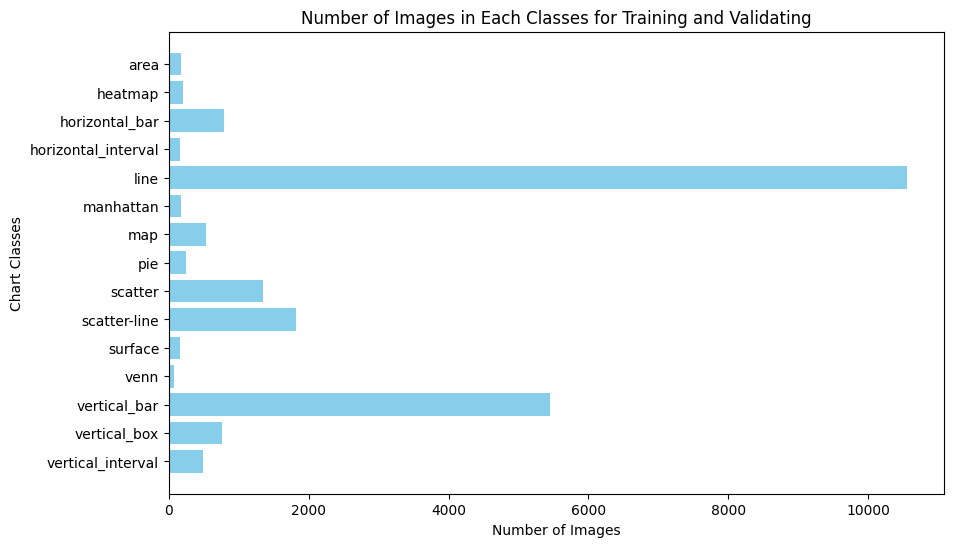

In [12]:
import os
import matplotlib.pyplot as plt

def count_images_in_subfolders(root_dir):
    subfolders = sorted(os.listdir(root_dir))
    image_counts = [len(os.listdir(os.path.join(root_dir, subfolder))) for subfolder in subfolders]
    return subfolders, image_counts

def plot_horizontal_bar_chart(subfolder_names, image_counts):
    plt.figure(figsize=(10, 6))
    plt.barh(subfolder_names, image_counts, color='skyblue')
    plt.xlabel('Number of Images')
    plt.ylabel('Chart Classes')
    plt.title('Number of Images in Each Classes for Training and Validating')
    plt.gca().invert_yaxis()  # Invert y-axis to display subfolders from top to bottom
    plt.show()


subfolder_names, image_counts = count_images_in_subfolders('original')
plot_horizontal_bar_chart(subfolder_names, image_counts)



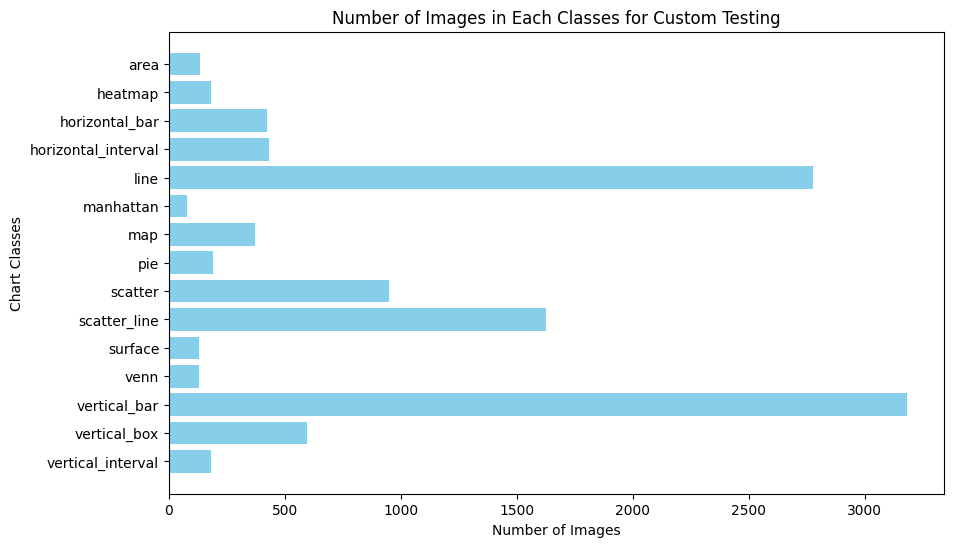

In [16]:
import json
from collections import Counter

def read_json(path):
    with open(path) as data:
        f = json.load(data)
        output = f['task1']['output']['chart_type']
    return output

def visualize_test(path):
    label_list = []
    exception_list = ['vertical bar', 'vertical interval', 'horizontal bar', 'horizontal interval', 'vertical box', 'scatter-line']
    replace_list = ['vertical_bar', 'vertical_interval', 'horizontal_bar', 'horizontal_interval', 'vertical_box', 'scatter_line']
    for file in sorted(os.listdir(path)):
        file_path = os.path.join(path, file)
        label = read_json(file_path)
        if label in exception_list:
            index = exception_list.index(label)
            label = replace_list[index]
        label_list.append(label)
    
    label_dict = Counter(label_list)
    names = sorted(list(Counter(label_list).keys()))
    image_counts = [label_dict[name] for name in names]


    plt.figure(figsize=(10, 6))
    plt.barh(names, image_counts, color='skyblue')
    plt.xlabel('Number of Images')
    plt.ylabel('Chart Classes')
    plt.title('Number of Images in Each Classes for Custom Testing')
    plt.gca().invert_yaxis()  # Invert y-axis to display subfolders from top to bottom
    plt.show()

visualize_test('image_test/labels')

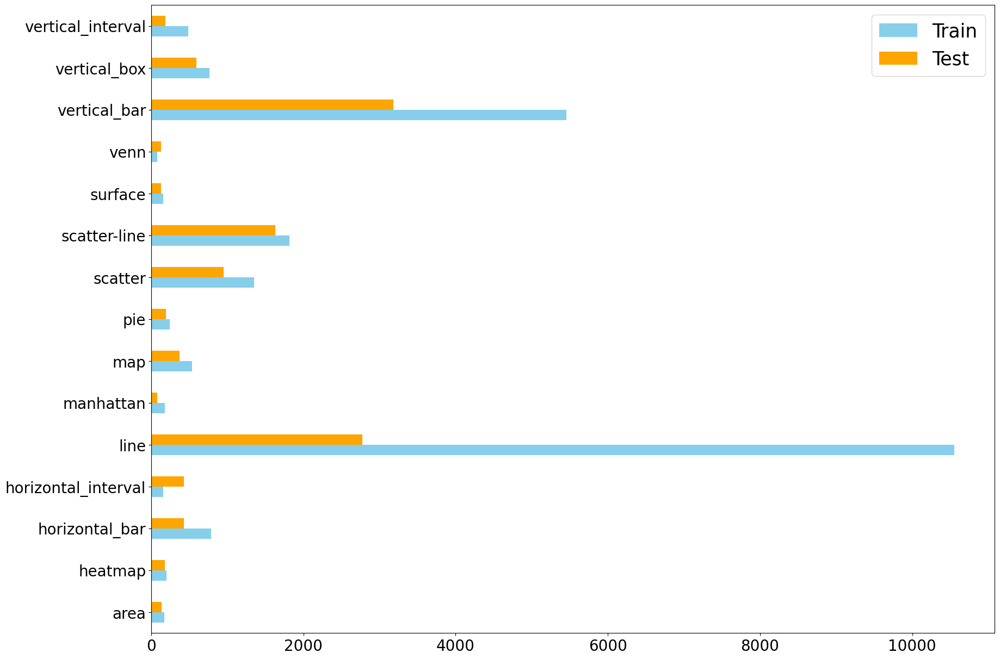

In [8]:
import pandas as pd
import json
import os
from collections import Counter
import matplotlib.pyplot as plt

#Test path
def read_json(path):
    with open(path) as data:
        f = json.load(data)
        output = f['task1']['output']['chart_type']
    return output

def visualize_test(path):
    label_list = []
    exception_list = ['vertical bar', 'vertical interval', 'horizontal bar', 'horizontal interval', 'vertical box', 'scatter-line']
    replace_list = ['vertical_bar', 'vertical_interval', 'horizontal_bar', 'horizontal_interval', 'vertical_box', 'scatter_line']
    for file in sorted(os.listdir(path)):
        file_path = os.path.join(path, file)
        label = read_json(file_path)
        if label in exception_list:
            index = exception_list.index(label)
            label = replace_list[index]
        label_list.append(label)
    
    label_dict = Counter(label_list)
    names = sorted(list(Counter(label_list).keys()))
    image_counts = [label_dict[name] for name in names]
    return image_counts

#Train path
def count_images_in_subfolders(root_dir):
    subfolders = sorted(os.listdir(root_dir))
    image_counts = [len(os.listdir(os.path.join(root_dir, subfolder))) for subfolder in subfolders]
    return subfolders, image_counts


subfolder_names, image_counts_train = count_images_in_subfolders('original')
image_counts_test = visualize_test('image_test/labels')
index = subfolder_names
# Create DataFrame
df = pd.DataFrame({'Train': image_counts_train, 'Test': image_counts_test}, index=index)

# Adjust plot size
fig, ax = plt.subplots(figsize=(20, 15))  # Adjust the values as needed

colors = ['skyblue', 'orange']  # You can specify colors here
df.plot.barh(ax=ax, color=colors)


# Set font size for labels and tick labels
# ax.xaxis.label.set_size(30)  # Adjust the font size for the x-axis label
# ax.yaxis.label.set_size(30)  # Adjust the font size for the y-axis label
ax.tick_params(axis='both', which='major', labelsize=20)
ax.legend(fontsize=25) # Adjust the font size for tick labels


# Show the plot
plt.show()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 2.1 MB/s eta 0:00:001.6 MB/s eta 0:00:01


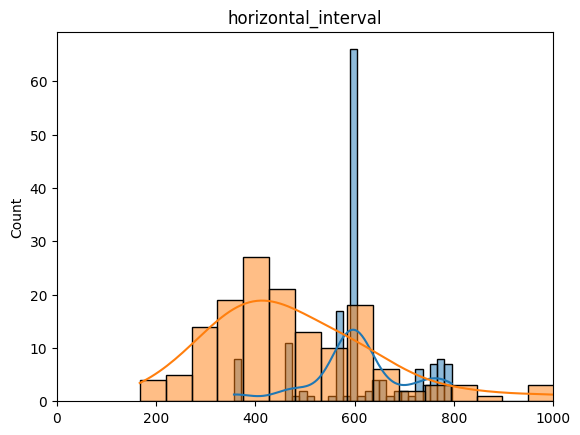

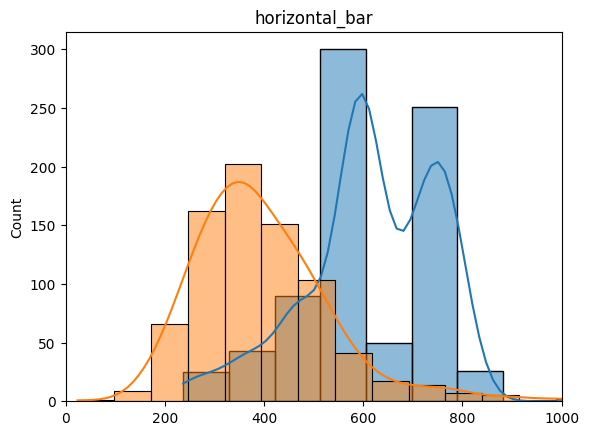

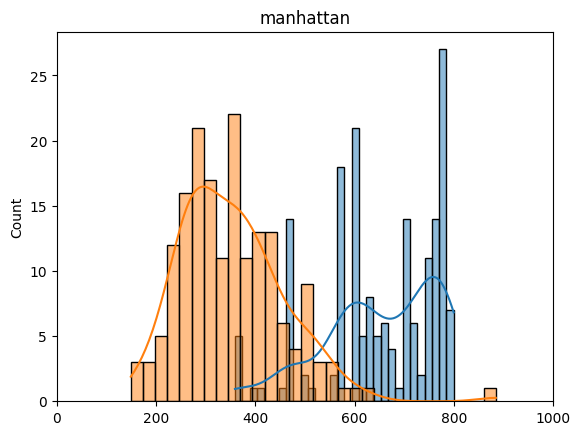

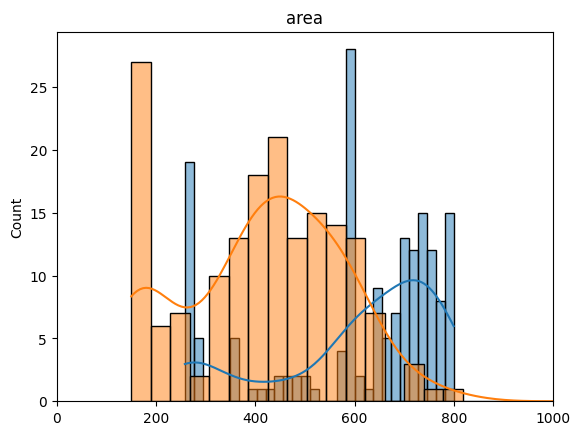

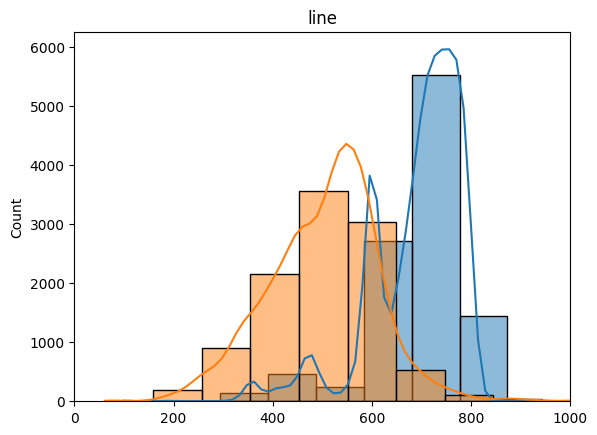

...

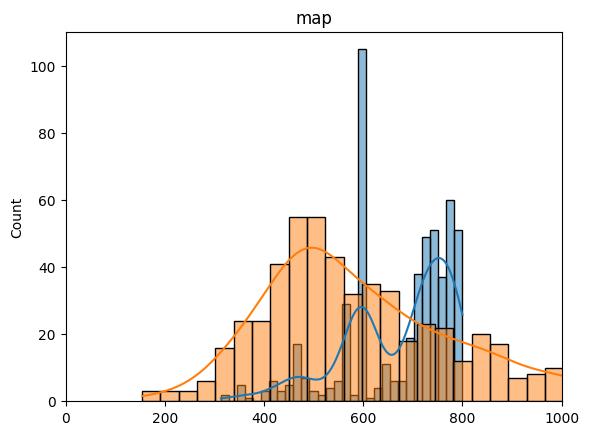

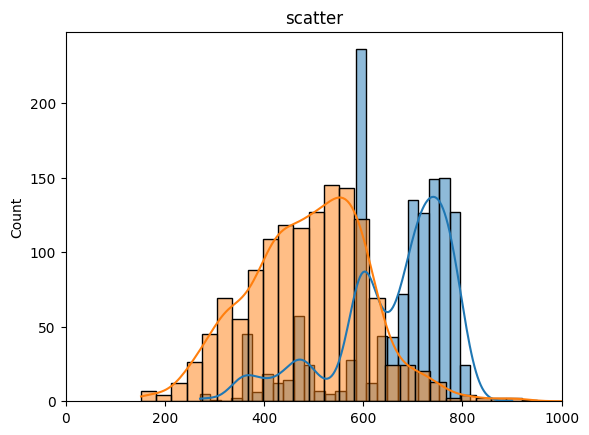

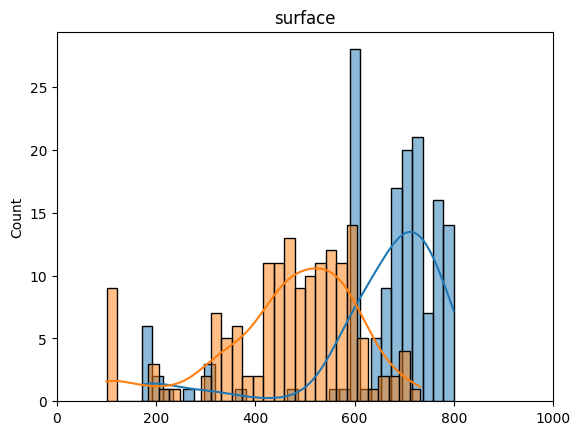

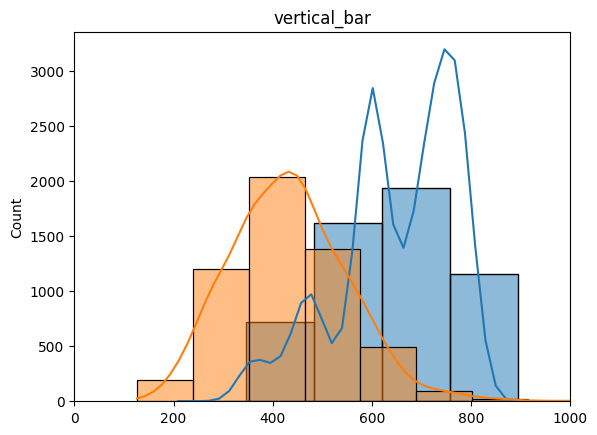

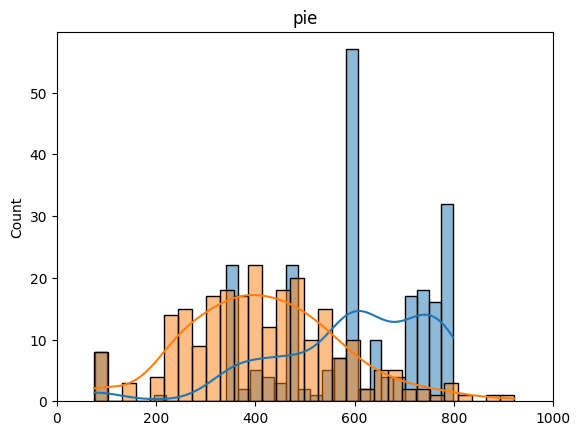

In [6]:
! pip install seaborn
import matplotlib.pyplot as plt
from pathlib import Path
import seaborn as sns
import numpy as np


for file in os.listdir(data):
    file_path = os.path.join(data, file)
    width = np.array([plt.imread(image).shape[1] for image in list(Path(file_path).glob('*.jpg'))])
    height = np.array([plt.imread(image).shape[0] for image in list(Path(file_path).glob('*.jpg'))])
    sns.histplot(data=width, bins=30, kde=True)
    sns.histplot(data=height, bins=30, kde=True)
    plt.xlim(0, 1000)
    plt.title(f"{file}")
    plt.show()





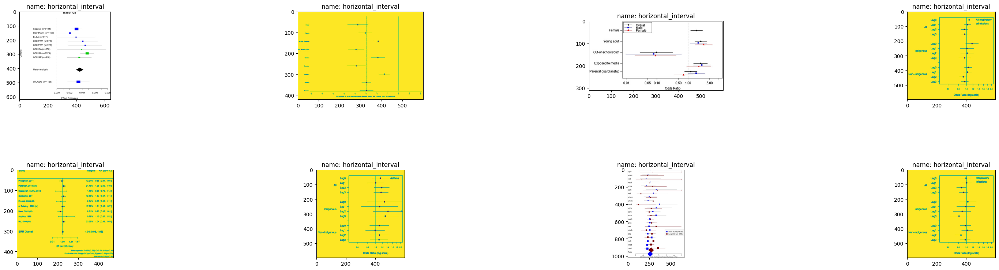

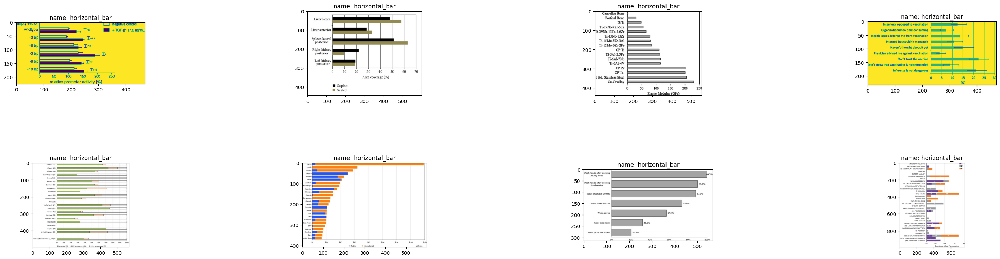

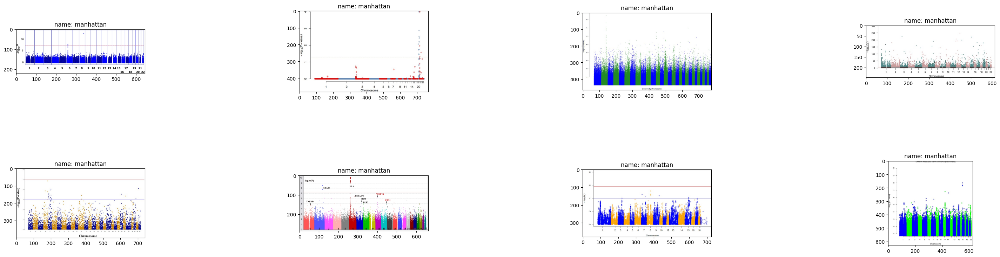

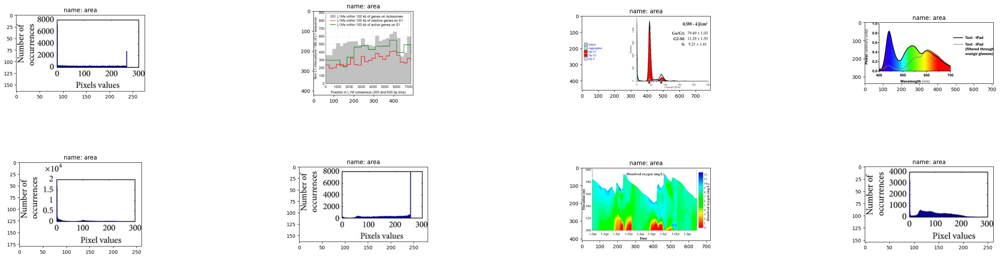

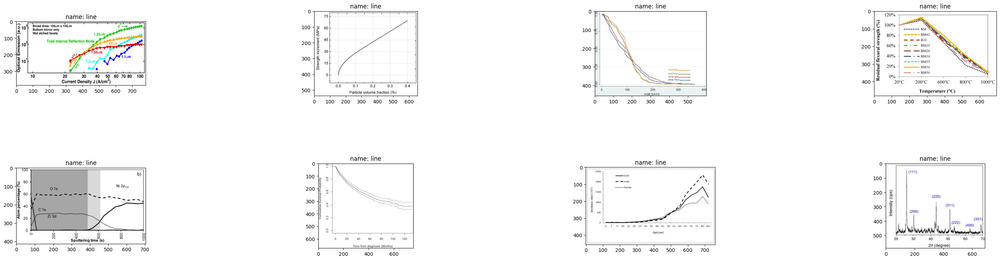

...

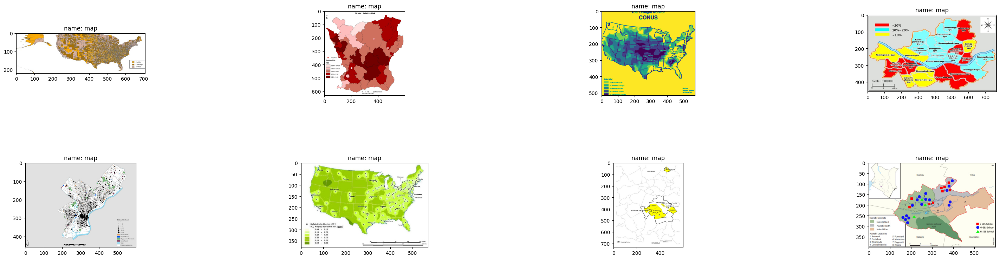

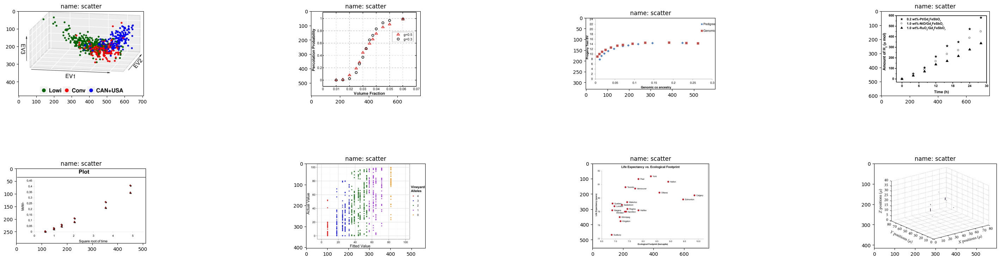

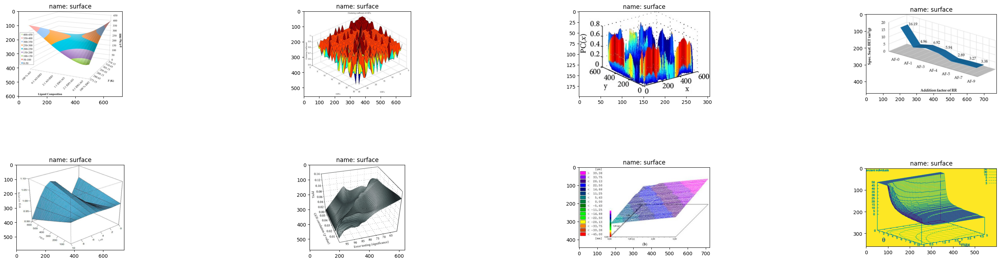

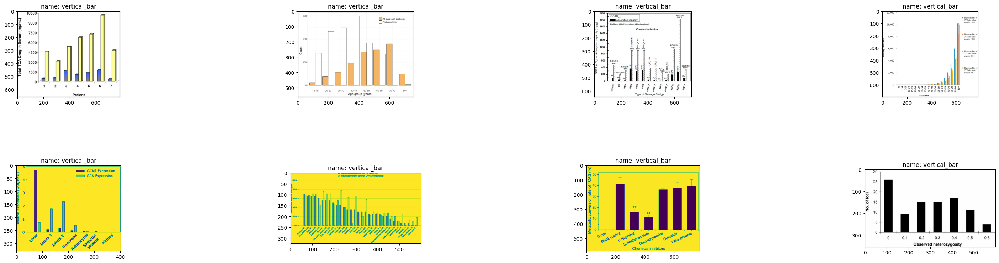

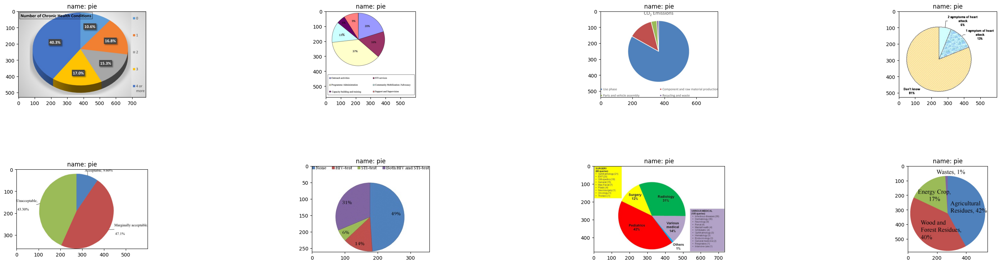

In [8]:
import random

for file in os.listdir(data):
    file_path = os.path.join(data, file)
    test_path = list(Path(file_path).glob('*.jpg'))
    test_samples = random.sample(population=test_path,k=8)

    fig = plt.figure(figsize=(36,20))
    columns = 4
    rows = 4
    fig.subplots_adjust(wspace=1.2, hspace=0.8)
    for i in range(1, 9                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         ):
        test_sample = [sample for sample in test_samples]
        image = plt.imread(test_sample[i-1])
        img_class = test_sample[i-1].parent.name
        fig.add_subplot(rows, columns, i)
        plt.title(f'name: {img_class}')    
        plt.imshow(image)

    plt.show()